<a href="https://colab.research.google.com/github/MLDreamer/Linkedin-posts/blob/main/Exponential_smoothing_types_illustration_on_synthetic_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<ipython-input-1-f39f101a238e>:20: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(start='2020-01-01', periods=time_steps, freq='Q')
/usr/local/lib/python3.11/dist-packages/pandas/util/_decorators.py:213: EstimationWarning: Model has no free parameters to estimate. Set optimized=False to suppress this warning
  return func(*args, **kwargs)


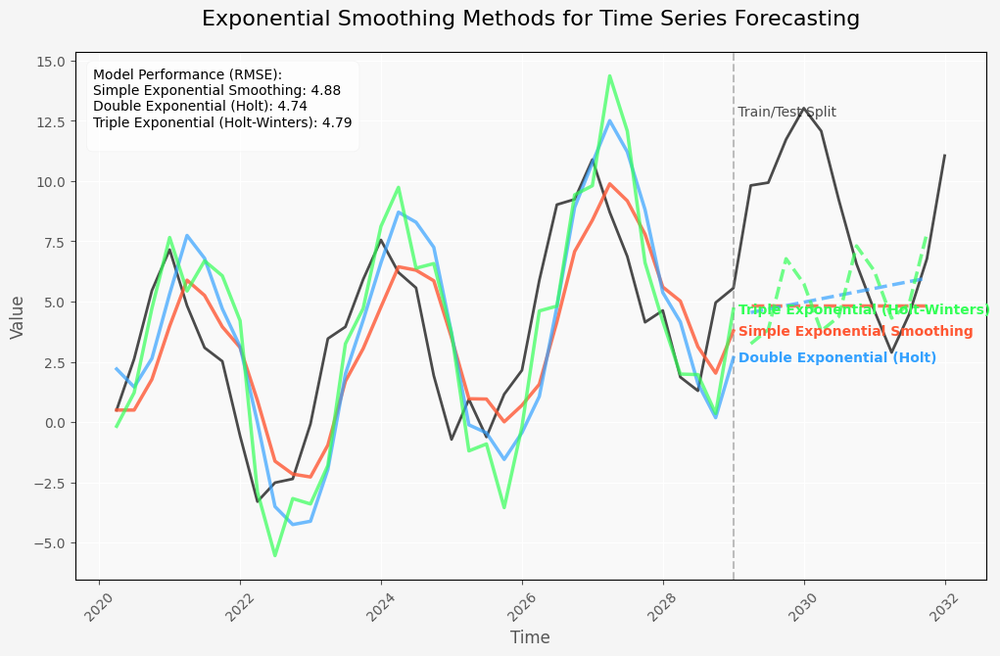

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from statsmodels.tsa.holtwinters import ExponentialSmoothing, SimpleExpSmoothing
from matplotlib.colors import LinearSegmentedColormap
from IPython.display import HTML

# Create synthetic data with trend and seasonality
np.random.seed(42)
time_steps = 48  # 4 years of quarterly data
trend = np.linspace(0, 10, time_steps)
seasonality = 5 * np.sin(np.linspace(0, 8*np.pi, time_steps))
noise = np.random.normal(0, 1, time_steps)
data = trend + seasonality + noise

# Split into train and test
train_size = 36
train, test = data[:train_size], data[train_size:]
dates = pd.date_range(start='2020-01-01', periods=time_steps, freq='Q')
train_dates = dates[:train_size]
test_dates = dates[train_size:]

# Define models and their colors
models = {
    'Simple Exponential Smoothing': {
        'color': '#FF5733',  # Orange-red
        'func': lambda: SimpleExpSmoothing(train).fit(smoothing_level=0.6)
    },
    'Double Exponential (Holt)': {
        'color': '#33A1FF',  # Light blue
        'func': lambda: ExponentialSmoothing(train, trend='add', seasonal=None).fit(smoothing_level=0.6, smoothing_trend=0.3)
    },
    'Triple Exponential (Holt-Winters)': {
        'color': '#33FF57',  # Light green
        'func': lambda: ExponentialSmoothing(train, trend='add', seasonal='add', seasonal_periods=4).fit(smoothing_level=0.6, smoothing_trend=0.3, smoothing_seasonal=0.6)
    }
}

# Fit models and generate forecasts
forecasts = {}
for name, model_info in models.items():
    model = model_info['func']()
    forecast = model.forecast(len(test))
    fitted = model.fittedvalues
    forecasts[name] = {
        'fitted': fitted,
        'forecast': forecast,
        'full': np.concatenate([fitted, forecast])
    }

# Create animation
fig, ax = plt.subplots(figsize=(12, 7))
plt.style.use('ggplot')

# Set modern background color
fig.patch.set_facecolor('#F5F5F5')
ax.set_facecolor('#F9F9F9')

def init():
    ax.clear()
    # Plot actual data
    ax.plot(dates, data, 'k-', alpha=0.7, linewidth=2, label='Actual Data')
    ax.axvline(x=train_dates[-1], color='gray', linestyle='--', alpha=0.5)
    ax.text(train_dates[-1], ax.get_ylim()[1]*0.95, ' Train/Test Split',
            verticalalignment='top', horizontalalignment='left', alpha=0.7)

    # Set labels and title
    ax.set_title('Exponential Smoothing Methods for Time Series Forecasting', fontsize=16, pad=20)
    ax.set_xlabel('Time', fontsize=12)
    ax.set_ylabel('Value', fontsize=12)

    # Customize ticks
    plt.xticks(rotation=45)
    return []

def animate(i):
    init()

    # Determine progress - increase smoothly across all forecasts
    if i < 30:  # First show fitted values (in-sample)
        progress = i / 30
        end_idx = int(train_size * progress)
        show_forecast = False
    else:  # Then show forecasts (out-of-sample)
        progress = (i - 30) / 30
        end_idx = train_size
        show_forecast = True
        forecast_idx = int(len(test) * progress)

    # Plot data with nice style
    for j, (name, model_data) in enumerate(forecasts.items()):
        fitted = model_data['fitted'][:end_idx]
        fitted_dates = train_dates[:end_idx]

        # Plot fitted values
        ax.plot(fitted_dates, fitted, color=models[name]['color'],
                linewidth=2.5, alpha=0.8 if j==0 else 0.7)

        # Add label at the end of line
        if len(fitted) > 0:
            ax.text(fitted_dates[-1], fitted[-1], f' {name}',
                    color=models[name]['color'], fontweight='bold',
                    verticalalignment='center')

        # Show forecast
        if show_forecast:
            forecast = model_data['forecast'][:forecast_idx]
            forecast_dates = test_dates[:forecast_idx]

            ax.plot(forecast_dates, forecast, color=models[name]['color'],
                    linewidth=2.5, linestyle='--', alpha=0.8 if j==0 else 0.7)

    # Add metrics if showing full forecast
    if i >= 59:
        metrics_text = "Model Performance (RMSE):\n"
        for name, model_data in forecasts.items():
            forecast = model_data['forecast']
            rmse = np.sqrt(np.mean((forecast - test)**2))
            metrics_text += f"{name}: {rmse:.2f}\n"

        ax.text(0.02, 0.97, metrics_text, transform=ax.transAxes,
                verticalalignment='top', horizontalalignment='left',
                bbox=dict(facecolor='white', alpha=0.7, boxstyle='round,pad=0.5'))

    return []

# Create animation
ani = animation.FuncAnimation(fig, animate, frames=60,
                             init_func=init, blit=True, interval=100)

# Save as GIF
ani.save('exponential_smoothing.gif', writer='pillow', fps=10, dpi=100)

# Display animation in notebook
HTML(ani.to_jshtml())